# BNB: Metadata and Gene Expression of Cells Selected by Region Sketch
Data is obtained from 10X Genomics

In [1]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from celldega.pre.boundary_tile import batch_transform_geometries
from celldega.pre import _to_geometry
import geopandas as gpd
from shapely.geometry import Point

# Data initialization

In [18]:
dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'

tech = 'Xenium'

DATA_DIR = f'../data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [19]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/sketched_regions_pixel.parquet')
display(gdf_pixel)

gdf_micron = gpd.read_parquet(f'{path_landscape_files}/sketched_regions_micron.parquet')
display(gdf_micron)


,area,roi,color,geometry
0,2.461366e+07,ROI 1,"[122.59886381215159, 215.16421072457422, 198.6...","POLYGON ((40977.726 19427.045, 42465.401 19345..."
1,1.024857e+08,ROI 2,"[47.07227503972313, 144.21756689589907, 213.94...","POLYGON ((17016.068 20203.619, 15703.772 23404..."


,area,roi,color,geometry
0,1.111461e+06,ROI 1,"[122.59886381215159, 215.16421072457422, 198.6...","POLYGON ((8707.768 4128.247, 9023.898 4110.995..."
1,4.627870e+06,ROI 2,"[47.07227503972313, 144.21756689589907, 213.94...","POLYGON ((3615.915 4293.269, 3337.052 4973.427..."


## Transform points from pixel space to micron space

In [20]:
cell_meta = pd.read_parquet(f"{path_landscape_files}/cell_metadata.parquet")
cell_meta["geometry"] = cell_meta["geometry"].apply(lambda coords: Point(coords[0], coords[1]))
cell_meta_gdf = gpd.GeoDataFrame(cell_meta, geometry="geometry", crs="EPSG:4326")

gdf_join = gdf_pixel.sjoin(cell_meta_gdf, how='right', predicate='intersects').drop(columns=['index_left'], errors='ignore')
df_cluster = pd.read_parquet(f"{dataset_name}/cell_clusters/cluster.parquet")
gdf_join['cluster'] = df_cluster['cluster']

gene_list = ['TP53', 'MUC16']

for gene in gene_list:
    df_gene = pd.read_parquet(f"{dataset_name}/cbg/{gene}.parquet")
    df_gene['cell_id'] = df_gene.index
    gdf_join = pd.merge(gdf_join, df_gene, on='cell_id', how='left')
    
gdf_join.head()

/Users/whuan/opt/anaconda3/envs/celldega_env_2025/lib/python3.10/site-packages/geopandas/geodataframe.py:2195: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)  # noqa: B026


,cell_id,area,roi,color,name,geometry,cluster,TP53,MUC16
0,aaaaebmm-1,NaN,NaN,NaN,aaaaebmm-1,POINT (2545.24510 19907.04354),7,1.0,NaN
1,aaaafhpp-1,NaN,NaN,NaN,aaaafhpp-1,POINT (2507.57966 19966.68049),8,NaN,1.0
2,aaaahcem-1,NaN,NaN,NaN,aaaahcem-1,POINT (2483.01107 19955.99575),7,1.0,NaN
3,aaaakeoi-1,NaN,NaN,NaN,aaaakeoi-1,POINT (2514.67869 19925.56376),7,NaN,NaN
4,aaaalald-1,NaN,NaN,NaN,aaaalald-1,POINT (2482.79393 19919.32525),1,NaN,1.0


In [21]:
path_transformation_matrix = f'{path_landscape_files}/micron_to_image_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)
gdf_join_micron = gdf_join.copy()
gdf_join_micron["geometry"] = batch_transform_geometries(gdf_join_micron["geometry"], inverse_matrix, 1)
gdf_join_micron['geometry'] = gdf_join_micron['geometry'].apply(_to_geometry)

## Cluster of region selected cells

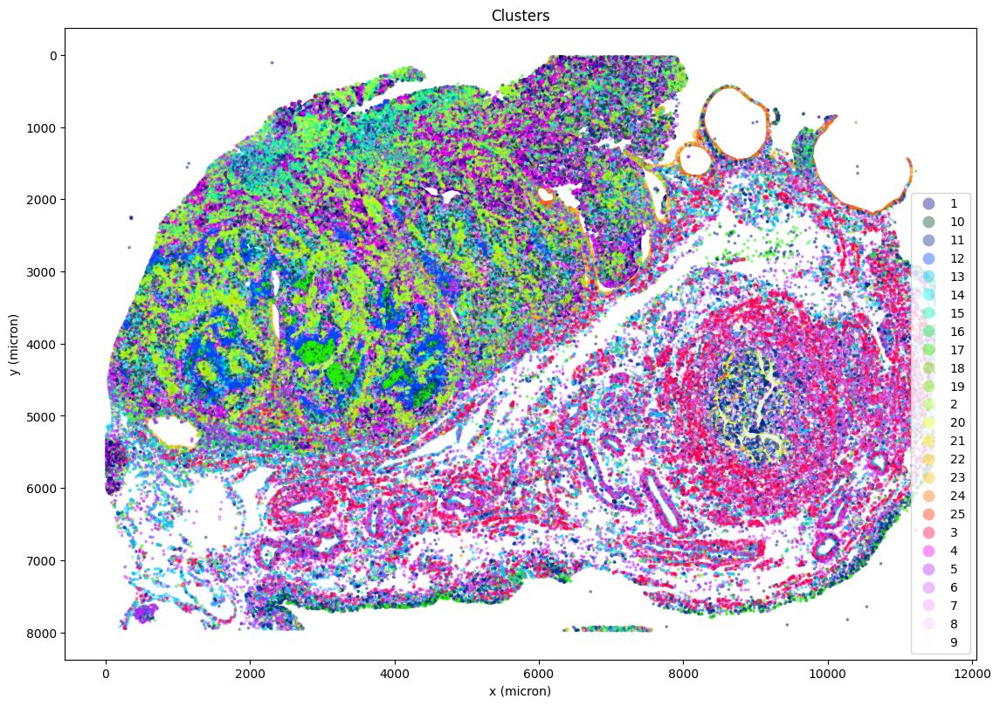

In [22]:

fig, ax = plt.subplots(figsize=(20,8))

# Plot the base layer (ROI)
gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='tab10', alpha=0.1)

gdf_join_micron.plot(
    ax=ax,
    column='cluster',
    aspect=1,
    legend=True,
    alpha=0.4,
    cmap='gist_ncar',
    markersize=3,
)

# Adjust the plot
ax.invert_yaxis()
plt.title("Clusters")
plt.tight_layout()
plt.xlabel('x (micron)')
plt.ylabel('y (micron)')
plt.show()


## Gene expression of region selected cells

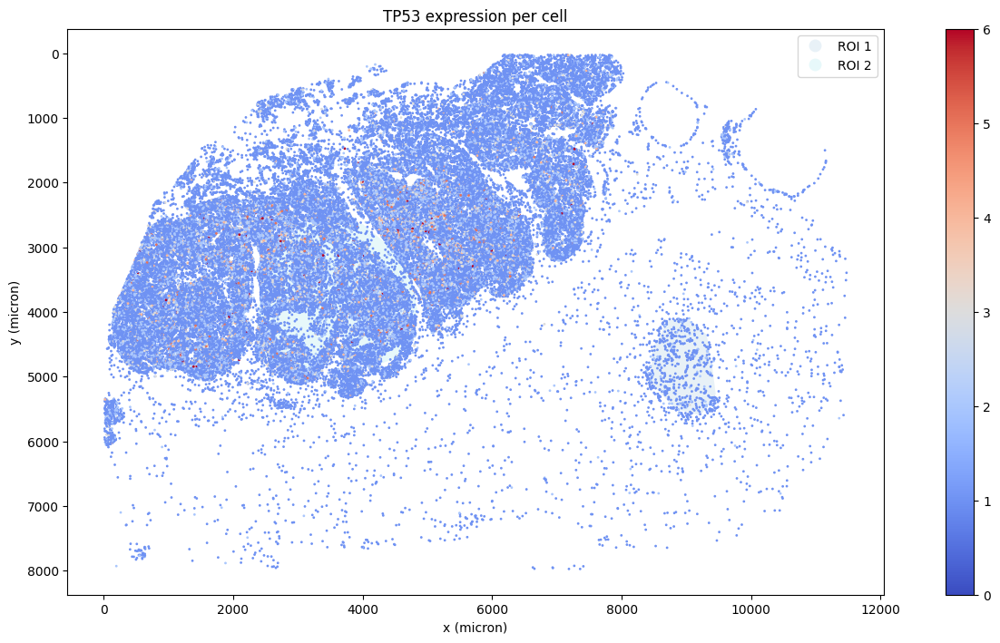

In [8]:
for gene in gene_list[:1]:

    fig, ax = plt.subplots(figsize=(14, 7))
    gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='tab10', alpha=0.1)
    gdf_join_micron.plot(ax=ax, aspect=1, column=gene, legend=True, vmin=0, vmax=6, cmap='coolwarm', s=1)

    ax.invert_yaxis()
    plt.title(f"{gene} expression per cell")
    plt.tight_layout()
    plt.xlabel('x (micron)')
    plt.ylabel('y (micron)')
    plt.show()